# Fine Clustering

Clustering genes into sets based on expression patterns.

In [58]:
library(Seurat)
library(dplyr)
library(ggplot2)
library(patchwork)
library(Matrix)
library(DESeq2)
library(ClusterR)
library(scales)
library(reshape2)
library(gprofiler2)

## Load Data

In [3]:
# raw counts data
rna.data = Read10X("/srv/scratch/surag/scRNA-reprog/filtered_feature_bc_matrix")

In [4]:
# saved Seurat session
rna = readRDS("./sessions/20200913_n27632.rds")

## Clustering

In [12]:
# get raw counts matrix
rna_subset_raw = rna.data[rownames(rna.data) %in% rownames(rna), 
                          colnames(rna.data) %in% colnames(rna)]
rna_subset_raw = Matrix::t(rna_subset_raw)
dim(rna_subset_raw)

[1] 59369 27632

In [13]:
clusters = as.numeric(rna@meta.data$RNA_snn_res.1)
agg_matrix = sparseMatrix(i=clusters,
                         j=seq(1,nrow(rna_subset_raw)),
                         x=1L,
                         dims=c(length(table(clusters)), nrow(rna_subset_raw)))

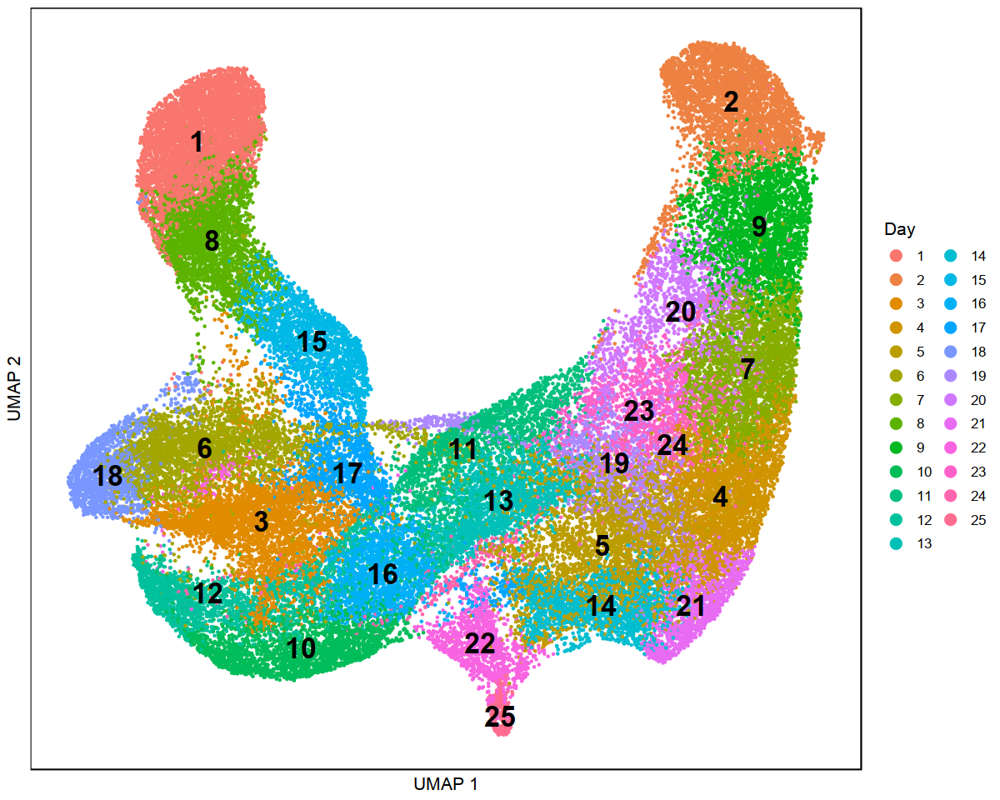

In [15]:
options(repr.plot.width = 10, repr.plot.height = 8)

plot_df <- data.frame(umap1=data.frame(Embeddings(rna, reduction='umap'))$UMAP_1,
                 umap2=data.frame(Embeddings(rna, reduction='umap'))$UMAP_2,
                 cluster=factor(clusters))
plot_df = plot_df[sample(dim(plot_df)[1]), ]

ggplot(plot_df) +
geom_point(aes(x=umap1, y=umap2, color=cluster), stroke=0, size=1) +
geom_text(data=data.frame(aggregate(plot_df[,c("umap1","umap2")], 
                            list(plot_df$cluster), median)),
         aes(x=umap1, y=umap2, label=Group.1), fontface = "bold", size=7) +
theme_classic() +
xlab("UMAP 1") + ylab("UMAP 2") +
theme(plot.title = element_text(hjust = 0.5),
      text = element_text(size=12),
      axis.line=element_blank(),
      axis.text.x=element_blank(),
      axis.text.y=element_blank(),
      axis.ticks=element_blank(),
      panel.border = element_rect(colour = "black", fill=NA, size=0.5)) +
guides(colour = guide_legend(title="Day",
     override.aes = list(shape=16, alpha=1, size=4)))

In [16]:
cts = as.matrix(agg_matrix %*% rna_subset_raw)
colnames(cts) = rownames(rna)
rownames(cts) = paste("cluster", seq(1,nrow(cts)), sep="_")
cts = t(cts)
head(cts)
dim(cts)

,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,cluster_10,⋯,cluster_16,cluster_17,cluster_18,cluster_19,cluster_20,cluster_21,cluster_22,cluster_23,cluster_24,cluster_25
AL627309.1,8,8,2,14,3,1,14,5,19,0,⋯,1,2,2,4,6,0,1,1,4,1
AL627309.5,36,81,13,36,24,26,34,12,72,10,⋯,10,13,7,10,24,11,10,6,10,3
AP006222.2,1,1,0,1,0,1,0,0,0,0,⋯,0,0,0,0,1,0,0,0,0,0
LINC01409,108,182,76,251,158,72,174,69,205,45,⋯,40,42,21,74,56,88,41,32,47,4
FAM87B,5,2,12,7,19,5,4,2,3,1,⋯,6,7,2,8,1,9,9,0,2,1
LINC01128,313,441,611,738,777,249,436,191,334,226,⋯,246,287,101,137,138,190,344,117,156,60


[1] 27632    25

In [17]:
quantile(rowSums(cts), c(0, 0.02, 0.05,  0.1, 0.25, 0.5, 0.75, 0.9, 0.99, 1))

0%          2%          5%         10%         25%         50% 
       0.00        2.00        4.00        7.00       41.00      859.00 
        75%         90%         99%        100% 
   12216.25    40642.20   396264.89 13024134.00

In [18]:
cts = cts[rowSums(cts)>100, ]
dim(cts)

[1] 18580    25

In [19]:
norm_cts = t(t(cts)/estimateSizeFactorsForMatrix(cts))

In [23]:
topk_var_genes = VariableFeatures(FindVariableFeatures(rna, selection.method = "vst", nfeatures = 5000))

In [24]:
"BCL2A1" %in% topk_var_genes

[1] TRUE

In [25]:
norm_cts = norm_cts[rownames(norm_cts) %in% topk_var_genes, ]
dim(norm_cts)

[1] 4045   25

In [26]:
log_norm_cts = log2(1+norm_cts)

In [27]:
cts_to_cluster = log_norm_cts 

# z norm
cts_to_cluster = t(scale(t(cts_to_cluster)))

# append z norm
# znormed = t(scale(t(cts_to_cluster)))
# colnames(znormed) = paste(colnames(znormed), "znorm", sep='_')
# cts_to_cluster = cbind(cts_to_cluster, znormed)

In [161]:
# ADD RAND SEED - not required
NUM_PEAK_SETS = 15
km_mb = MiniBatchKmeans(cts_to_cluster, 
                        batch_size = 1000,
                        clusters = NUM_PEAK_SETS,
                        num_init = 50, 
                        verbose = FALSE)

In [162]:
pr_mb = predict_MBatchKMeans(cts_to_cluster, km_mb$centroids)

In [163]:
sort(table(pr_mb))

pr_mb
  3   7   9   8   2  14   4  13   1  10   6  12   5  11  15 
166 183 192 195 198 200 214 219 230 244 303 330 402 467 502 

In [164]:
cts_clustered = cts_to_cluster[order(pr_mb), 1:length(unique(clusters))] # divide when znormed pasted
head(cts_clustered, 2)

,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,cluster_10,⋯,cluster_16,cluster_17,cluster_18,cluster_19,cluster_20,cluster_21,cluster_22,cluster_23,cluster_24,cluster_25
MRTO4,-1.840338,-0.4172945,0.5480104,0.9188596,0.7946830,-0.8235673,1.3169360,-0.82595130,0.07418406,0.02626024,⋯,1.340110,1.1716720,-1.8028575,-0.7363285,-0.3951270,-0.1637002,0.58951398,0.9221537,0.1390243,-0.3895543
CLSPN,-2.216787,0.4550117,1.1661376,0.1197661,0.5902209,-0.3721969,0.7998924,-0.07339261,0.46188539,-0.07021471,⋯,0.896641,0.9785777,-0.8909335,-1.3735610,0.0303348,-0.9481522,-0.08653249,0.9116413,0.1540742,-0.6477176


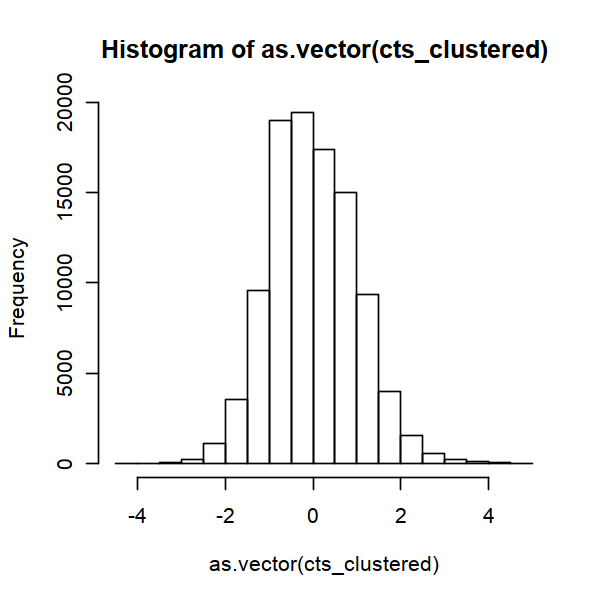

In [165]:
options(repr.plot.width = 5, repr.plot.height = 5)
hist(as.vector(cts_clustered))

In [166]:
sample(rownames(cts_to_cluster)[(which(pr_mb==4))], 10)

[1] "FABP3"  "MYBPH"  "ACO1"   "IGF1"   "SOCS3"  "HBG1"   "MRGPRF" "PKDCC" 
 [9] "CCL3L1" "KLF2"

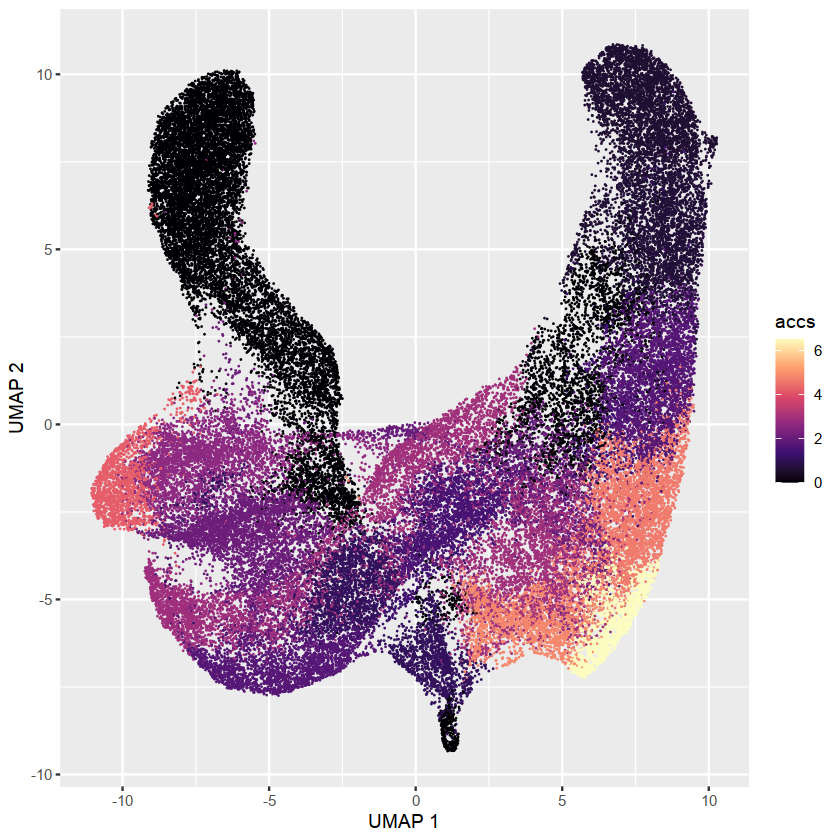

In [167]:
options(repr.plot.width = 7, repr.plot.height = 7)

# visualize a centroid
# df = data.frame(x.sp@umap, accs=km_mb$centroids[selected_cluster_id, ][clusters])

# or a specific peak
df = data.frame(umap1=data.frame(Embeddings(rna, reduction='umap'))$UMAP_1, 
                umap2=data.frame(Embeddings(rna, reduction='umap'))$UMAP_2, 
                accs=log2(norm_cts["PTGDR", ][clusters]+1))

# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.5, stroke = 0,alpha=1, aes(x=umap1 , y=umap2, col=accs)) +
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(#limits=c(0, 6),
                      oob=squish, option = "A") +
theme(plot.title = element_text(hjust = 0.5))

In [172]:
gene_lists = list()
for (i in seq(length(table(pr_mb)))) {
    gene_lists[[i]] = rownames(cts_to_cluster)[(which(pr_mb==i))]
}

In [206]:
plots = list()
for (i in seq(1,NUM_PEAK_SETS)) {
    df = data.frame(umap1=data.frame(Embeddings(rna, reduction='umap'))$UMAP_1, 
                    umap2=data.frame(Embeddings(rna, reduction='umap'))$UMAP_2, 
                    znorm_expr=km_mb$centroids[i, ][clusters])
    # shuffle so days don't overlap
    df = df[sample(dim(df)[1], 20000), ]
    
    plots[[i]] <- ggplot(df) +
    # ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
    geom_point(size=0.8, stroke = 0, alpha=1, aes(x=umap1 , y=umap2, col=znorm_expr)) +
    ggtitle(sprintf("Cluster %d (%d)", i, length(gene_lists[[i]]))) + 
    xlab("UMAP 1") + ylab("UMAP 2") +
    scale_color_viridis_c(limits=c(-2,2), oob=squish, option = "A") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5),
         legend.position = "none",
         axis.ticks = element_blank(),
         axis.text =element_blank(),
         axis.line=element_blank(),
         panel.border = element_rect(colour = "black", fill=NA, size=0.5))
}

In [224]:
sc_plots = list()
for (i in seq(1,NUM_PEAK_SETS)) {
    tot_counts = colSums(rna@assays$RNA@data[gene_lists[[i]], ])
    df = data.frame(umap1=data.frame(Embeddings(rna, reduction='umap'))$UMAP_1, 
                    umap2=data.frame(Embeddings(rna, reduction='umap'))$UMAP_2, 
                    norm_reads=tot_counts)
    # shuffle so days don't overlap
    df = df[sample(dim(df)[1], 20000), ]
    
    sc_plots[[i]] <- ggplot(df) +
    # ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
    geom_point(size=0.8, stroke = 0, alpha=1, aes(x=umap1 , y=umap2, col=norm_reads)) +
    ggtitle(sprintf("Cluster %d (%d)", i, length(gene_lists[[i]]))) + 
    xlab("UMAP 1") + ylab("UMAP 2") +
    scale_color_viridis_c(limits=c(0,quantile(tot_counts, 0.99)), oob=squish, option = "A") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5),
         axis.ticks = element_blank(),
         axis.text =element_blank(),
         axis.line=element_blank(),
         panel.border = element_rect(colour = "black", fill=NA, size=0.5))
}

In [204]:
# get legend
df = data.frame(umap1=data.frame(Embeddings(rna, reduction='umap'))$UMAP_1, 
                umap2=data.frame(Embeddings(rna, reduction='umap'))$UMAP_2,
                znorm_expr=km_mb$centroids[1, ][clusters])
# shuffle so days don't overlap
df = df[sample(dim(df)[1], 20000), ]

cur_plot <- ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=1, alpha=1, aes(x=umap1 , y=umap2, col=znorm_expr)) +
ggtitle(sprintf("Cluster %d", i)) + 
xlab("UMAP 1") + ylab("UMAP 2") +
scale_color_viridis_c(limits=c(-2, 2), oob=squish, option = "A") +
theme_classic() +
theme(plot.title = element_text(hjust = 0.5),
     axis.ticks = element_blank(),
     axis.text =element_blank(),
     axis.line=element_blank(),
     panel.border = element_rect(colour = "black", fill=NA, size=0.5))

legend_only = cowplot::get_legend(cur_plot)

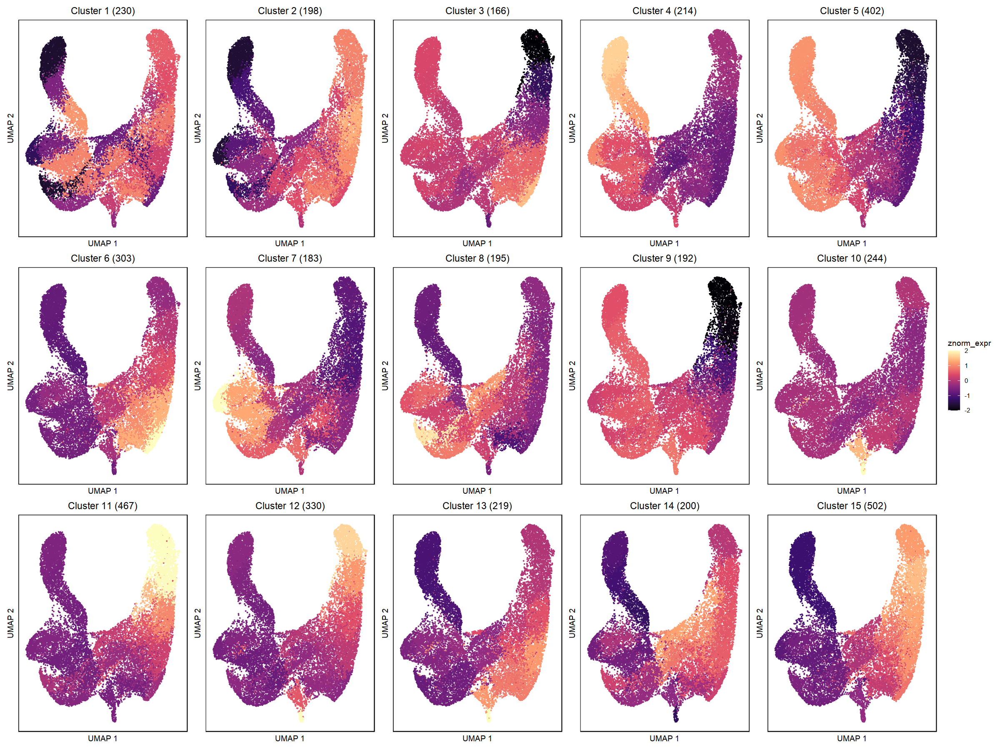

In [207]:
options(repr.plot.width = 20, repr.plot.height = 15)
wrap_plots(wrap_plots(plots, ncol = 5), legend_only, widths=c(0.95,0.05))  
# ggsave(sprintf("figs/20200705_gridmap_peakwidthnorm_logplusznorm_4way_ordered_n40/log_cts.jpeg"),
#                format(Sys.Date(), format='%Y%m%d'), length(table(pr_mb))),
#        width=20, height=40, dpi=300)

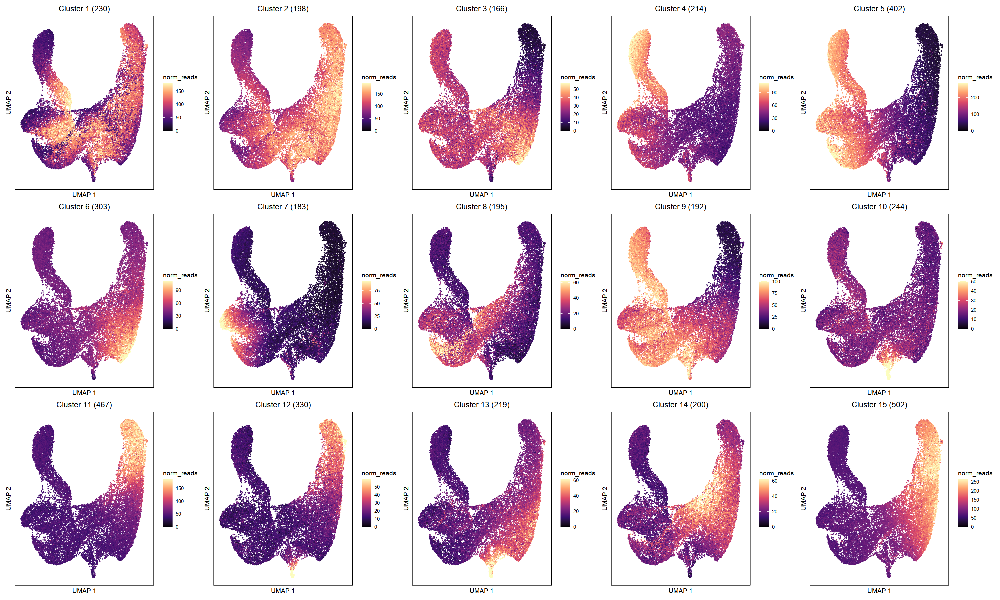

In [225]:
options(repr.plot.width = 25, repr.plot.height = 15)
wrap_plots(wrap_plots(sc_plots, ncol = 5))
# ggsave(sprintf("figs/20200705_gridmap_peakwidthnorm_logplusznorm_4way_ordered_n40/log_cts.jpeg"),
#                format(Sys.Date(), format='%Y%m%d'), length(table(pr_mb))),
#        width=20, height=40, dpi=300)

In [171]:
CLUSTER_IDX = 1
NORM = 'tmp_gridmap_znorm'
GENE_SET_PATH = sprintf("gene_sets/%s_%s_n%d/idx%d.txt", format(Sys.Date(), format='%Y%m%d'), NORM, length(table(pr_mb)), CLUSTER_IDX)
# rownames(vsd_assay_to_cluster_normalized)[(which(pr_mb==CLUSTER_IDX))]
GENE_SET_PATH

[1] "gene_sets/20200914_tmp_gridmap_znorm_n15/idx1.txt"

In [41]:
for (i in seq(1,length(table(pr_mb)))){
GENE_SET_PATH = sprintf("gene_sets/%s_%s_n%d/idx%d.txt", format(Sys.Date(), format='%Y%m%d'), NORM, length(table(pr_mb)), i)
fileConn = file(GENE_SET_PATH)
writeLines(rownames(cts_to_cluster)[(which(pr_mb==i))], fileConn)
close(fileConn)}

## GSE62777 Comparison

In [173]:
# load bulk RNA-seq data
fpkm = read.table("/users/surag/kundajelab/scATAC-reprog/resources/GSE62777/RNAseq.FPKM.tsv", sep='\t', header=T)
fpkm$gene_id = NULL
fpkm$locus=NULL
tpm = fpkm
tpm[,2:ncol(tpm)] = 1e6*t(t(tpm[,2:ncol(tpm)])/colSums(tpm[,2:ncol(tpm)]))

# removing genes with dup names
tpm = tpm[!duplicated(tpm$gene_short_name),]
rownames(tpm) = tpm$gene_short_name
tpm$gene_short_name = NULL

tpm["GAPDH",]

,hiF.T_P14,X2dd_DOX_plus,X5dd_DOX_plus,X8dd_DOX_plus,X10dd_DOX_plus_SSEA3_pos,X14dd_DOX_plus_SSEA3_pos,X20dd_DOX_plus_TRA_plus,X24dd_TRA_pos_DOX_plus,X24dd_TRA_pos_DOX_minus,hIPSC.T_P10
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
GAPDH,7803.64,4963.505,3908.693,3839.776,3795.548,3364.503,3032.412,3790.955,5598.224,4731.256


In [174]:
gene_plots = list()

In [175]:
for (i in seq(NUM_PEAK_SETS)) {
    # remove transcript name from gene
    # assumes gene lists are tables sorted in decreasing importance
    gene_set_to_plot = gene_lists[[i]]
    
    # filter to those that have >1 TPM at any time point
    gene_set_to_plot = gene_set_to_plot[gene_set_to_plot %in% rownames(tpm)]
    gene_set_to_plot = gene_set_to_plot[rowMaxs(as.matrix(tpm[gene_set_to_plot, ]))>1]

    # choose top
    gene_set_to_plot = gene_set_to_plot

    gene_plots[[i]] <- 
    ggplot(melt(as.matrix(log2(1+tpm)[rownames(tpm) %in% gene_set_to_plot, ])), aes(x=Var2, y=value)) +
    #     ggplot(melt(t(scale(t(log2(1+tpm)[rownames(tpm) %in% gene_set_to_plot, ])))), aes(x=Var2, y=value)) +
    stat_boxplot() +
    #     geom_line(aes(group=Var1),size=0.1) + geom_point() +
    ggtitle(sprintf("GENE SET %d", i)) +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5),
      text = element_text(size=12),
#       axis.line=element_blank(),
      axis.text.x = element_text(angle = -45, hjust=0),
#       axis.text.y=element_blank(),
#       axis.ticks=element_blank(),
      legend.title=element_text(size=10), 
      legend.text=element_text(size=9),
      panel.border = element_rect(colour = "black", fill=NA, size=0.5)) +
    ylab("log2 TPM") + xlab("") +
    coord_cartesian(ylim=c(0,10)) 
}

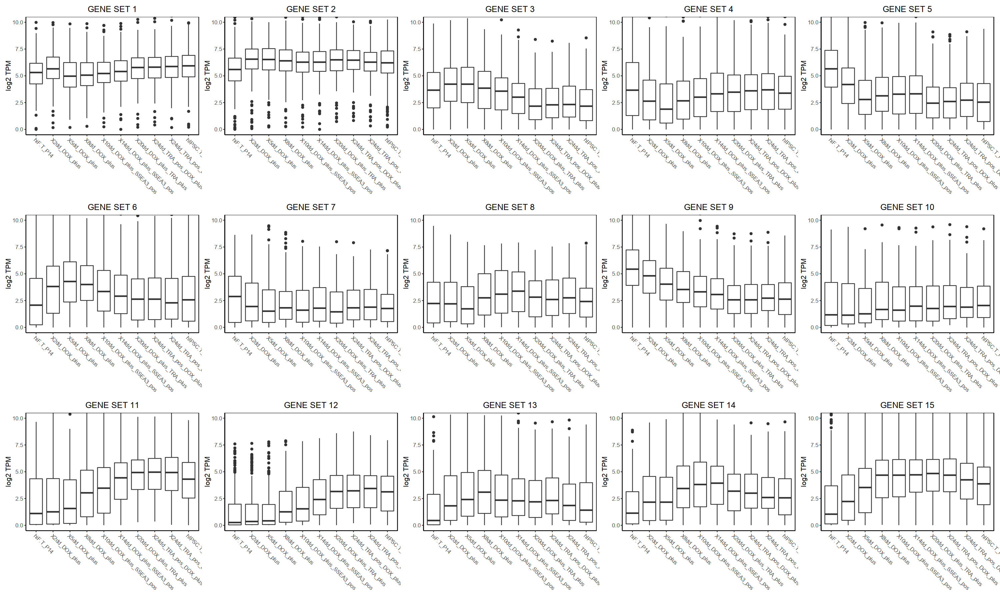

In [177]:
options(repr.plot.width = 25, repr.plot.height = 15)

wrap_plots(gene_plots, ncol = 5)

## g:Profiler

In [178]:
# assumes gene_table is sorted in decreasing importance
get_gprof_gost_res <- function(genes) {
    gostres = gost(genes, 
              organism="hsapiens",
              significant=F, # return all
              ordered_query=F)
    
    # compute enrichment (intersection/list_length)/(total_terms/total_genes)
    gostres$result$enrichment = (gostres$result$intersection_size/gostres$result$query_size)/(gostres$result$term_size/gostres$result$effective_domain_size)
    
    gostres
}

In [179]:
gprof_res = mclapply(gene_lists,
                     get_gprof_gost_res,
                     mc.cores=10)

In [230]:
filtered = gprof_res[[6]]$result
filtered = filtered[filtered$significant==TRUE, ]
filtered = filtered[filtered$source=="GO:BP", c(4,5,6,12, 10,11,3, 15)]
dim(filtered)
head(filtered[(order(filtered$p_value)), ], 5)

[1] 21  8

,term_size,query_size,intersection_size,effective_domain_size,source,term_name,p_value,enrichment
,<int>,<int>,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>
112,1068,204,31,17916,GO:BP,cell morphogenesis,0.002889849,2.549185
113,611,204,22,17916,GO:BP,cell morphogenesis involved in neuron differentiation,0.003883017,3.162222
114,6117,204,102,17916,GO:BP,anatomical structure development,0.003966950,1.464443
115,674,204,23,17916,GO:BP,neuron projection morphogenesis,0.005524962,2.996945
116,1453,204,37,17916,GO:BP,cell adhesion,0.005592227,2.236387


## Enrichment Matrices

In [182]:
MAX_LOG10_PVAL = 3 # restrict max p-value for clustering
SIG_PVAL = -log10(0.05)

make_term_peak_set_matrix <- function(term_list, sources) {
    # term_x_peak matrix
    txp_matrix = matrix(0, length(term_list), length(gene_lists))
    row.names(txp_matrix) = term_list
    colnames(txp_matrix) = seq(1, length(gene_lists))

    for (i in seq(length(gene_lists))) { 
        filtered = gprof_res[[i]]$result
        filtered = filtered[as.character(filtered$term_name) %in% term_list, ]
        filtered = filtered[as.character(filtered$source) %in% sources, ] # need source since some terms are duplicated
        rownames(filtered) = filtered$term_name
        txp_matrix[,i] = -log10(filtered[rownames(txp_matrix), ]$p_value)
    }

    txp_matrix[is.na(txp_matrix)] = 0
    txp_matrix[txp_matrix>MAX_LOG10_PVAL] = MAX_LOG10_PVAL
    
    txp_matrix
}

make_melted_txp_matrix <- function(txp_matrix, peak_set_order) {
    # reorder terms, but specify peak order
    term_order = hclust(dist(txp_matrix, method = "euclidean"), method = "ward.D")$order

    txp_matrix_melted = melt(txp_matrix)
    txp_matrix_melted$symbol = ifelse(txp_matrix_melted$value>= SIG_PVAL, "*", "")

    txp_matrix_melted$Var2 = factor(txp_matrix_melted$Var2, 
                                     levels=levels(factor(txp_matrix_melted$Var2))[peak_set_order])
    txp_matrix_melted$Var1 = factor(txp_matrix_melted$Var1, 
                                     levels=levels(txp_matrix_melted$Var1)[term_order])

    txp_matrix_melted
}

plot_melted_txp_matrix <- function(txp_matrix_melted) {
    plot <- ggplot(txp_matrix_melted) +
    geom_tile(aes(x=Var2, 
                  y=Var1, 
                  fill= value),
             colour="black",
             size=0.5) +
    scale_fill_gradient(low="white",
                          high="red",
                          limits=c(0,3),
                          oob=squish,
                          name="- Log P-value") +
    geom_text(aes(x=Var2, y=Var1, label=symbol), vjust = 0.75) + 
    scale_y_discrete(position = "right") +
    ylab("") + xlab("Peak Set") +
    theme_classic() +
    theme(plot.title = element_text(hjust = 0.5),
      text = element_text(size=15),
      axis.text.x = element_text(angle = -90, hjust=0, vjust=0.5),
      legend.title=element_text(size=10), 
      legend.text=element_text(size=9),
      axis.ticks=element_blank(),
      panel.border = element_rect(colour = "black", fill=NA, size=2),
      legend.position = "left") 
    
    plot
}


### GO:BP Matrix

In [189]:
# make a list of GO terms using cutoffs

ENRICH_CUTOFF = 2
TERM_SIZE_MAX = 2000
TOP_BY_PVAL = 25 # add top K by pval per peak set
TOP_BY_ENRICH = 25 # add top K by enrichment per peak set
gobp_terms = c()

for (i in seq(length(gene_lists))) {
    filtered = gprof_res[[i]]$result
    filtered = filtered[filtered$significant==TRUE, ]
    filtered = filtered[filtered$source=="GO:BP", c(4,5,6,12, 10,11,3, 15)]
    filtered = filtered[filtered$enrichment>ENRICH_CUTOFF, ]
    filtered = filtered[filtered$term_size<TERM_SIZE_MAX, ]
    filtered = filtered[unique(order(filtered$p_value)[1:TOP_BY_PVAL],
                              rev(order(filtered$enrichment))[1:TOP_BY_ENRICH]), ]
    
    gobp_terms = unique(c(gobp_terms, filtered$term_name))
}

# gobp_terms = names(table(gobp_terms)[table(gobp_terms)<=MAX_APPEARANCES])
gobp_terms = gobp_terms[!is.na(gobp_terms)]
length(gobp_terms)

[1] 212

In [222]:
gobp_terms[grep("stem", gobp_terms)]
gobp_terms[grep("pluri", gobp_terms)]
gobp_terms[grep("fibro", gobp_terms)]
gobp_terms[grep("apop", gobp_terms)]
gobp_terms[grep("water", gobp_terms)]
gobp_terms[grep("adhesion", gobp_terms)]
gobp_terms[grep("metal", gobp_terms)]

[1] "embryonic skeletal system morphogenesis"
[2] "circulatory system development"         
[3] "stem cell differentiation"              
[4] "embryonic skeletal system development"  
[5] "cardiovascular system development"      
[6] "skeletal system development"            
[7] "muscle system process"

character(0)

character(0)

[1] "regulation of myeloid cell apoptotic process"         
[2] "myeloid cell apoptotic process"                       
[3] "inflammatory cell apoptotic process"                  
[4] "positive regulation of myeloid cell apoptotic process"
[5] "negative regulation of apoptotic process"             
[6] "regulation of apoptotic process"

character(0)

[1] "cell adhesion"       "biological adhesion" "cell-cell adhesion"

character(0)

In [191]:
gobp_matrix = make_term_peak_set_matrix(gobp_terms, sources=c("GO:BP"))
GENE_SET_ORDER = rev(hclust(dist(t(gobp_matrix), method = "euclidean"), method = "ward.D")$order) # use for REAC plot also
# GENE_SET_ORDER = seq(1, ncol(gobp_matrix)) # no reorder
gobp_matrix_melted = make_melted_txp_matrix(gobp_matrix, GENE_SET_ORDER)

In [192]:
# remove idx from peak set 
# gobp_matrix_melted$Var2 = factor(sub("idx", "", gobp_matrix_melted$Var2),
#                                  sub("idx", "", levels(gobp_matrix_melted$Var2)))

In [193]:
gobp_plot = plot_melted_txp_matrix(gobp_matrix_melted)

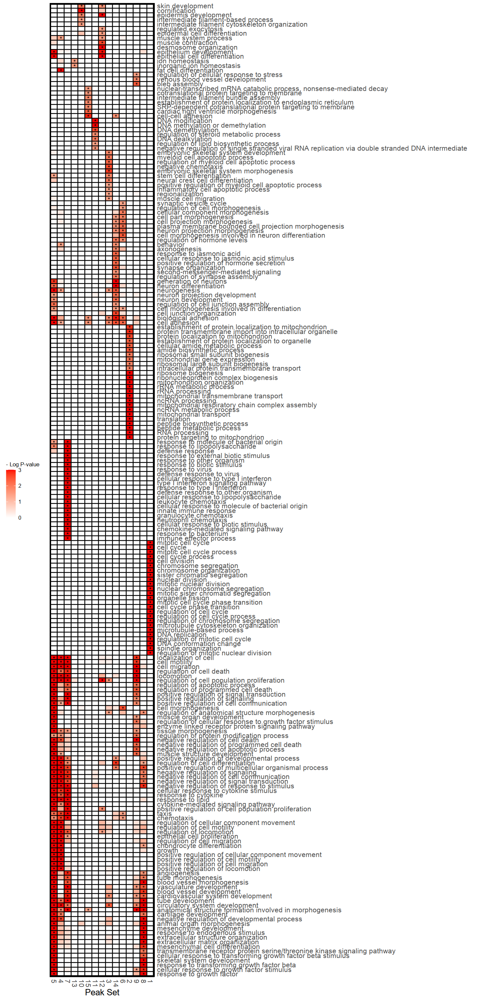

In [194]:
options(repr.plot.width = 12, repr.plot.height = 25)

gobp_plot

In [155]:
# saveRDS(gobp_plot, file=sprintf("./subfigs/%s_go_terms.rds",
#                                 format(Sys.Date(), "%Y%m%d")))

### REAC Matrix

In [195]:
# make a list of REAC terms using cutoffs

ENRICH_CUTOFF = 1.5
TERM_SIZE_MAX = 2000
TOP_BY_PVAL = 20 # add top K by pval per peak set
TOP_BY_ENRICH = 20 # add top K by enrichment per peak set
reac_terms = c()

for (i in seq(length(gene_lists))) {
    filtered = gprof_res[[i]]$result
    filtered = filtered[filtered$significant==TRUE, ]
    filtered = filtered[filtered$source=="REAC", c(4,5,6,12, 10,11,3, 15)]
    filtered = filtered[filtered$enrichment>ENRICH_CUTOFF, ]
    filtered = filtered[filtered$term_size<TERM_SIZE_MAX, ]
    filtered = filtered[unique(order(filtered$p_value)[1:TOP_BY_PVAL],
                              rev(order(filtered$enrichment))[1:TOP_BY_ENRICH]), ]
    
    reac_terms = unique(c(reac_terms, filtered$term_name))
}

reac_terms = reac_terms[!is.na(reac_terms)]
length(reac_terms)

[1] 92

In [200]:
reac_terms[grep("pluri", reac_terms)]
reac_terms[grep("fibro", reac_terms)]
reac_terms[grep("apop", reac_terms)]
reac_terms[grep("water", reac_terms)]

[1] "Transcriptional regulation of pluripotent stem cells"

character(0)

character(0)

character(0)

In [201]:
reac_matrix = make_term_peak_set_matrix(reac_terms, sources=c("REAC"))
reac_matrix_melted = make_melted_txp_matrix(reac_matrix, GENE_SET_ORDER)
reac_plot = plot_melted_txp_matrix(reac_matrix_melted)

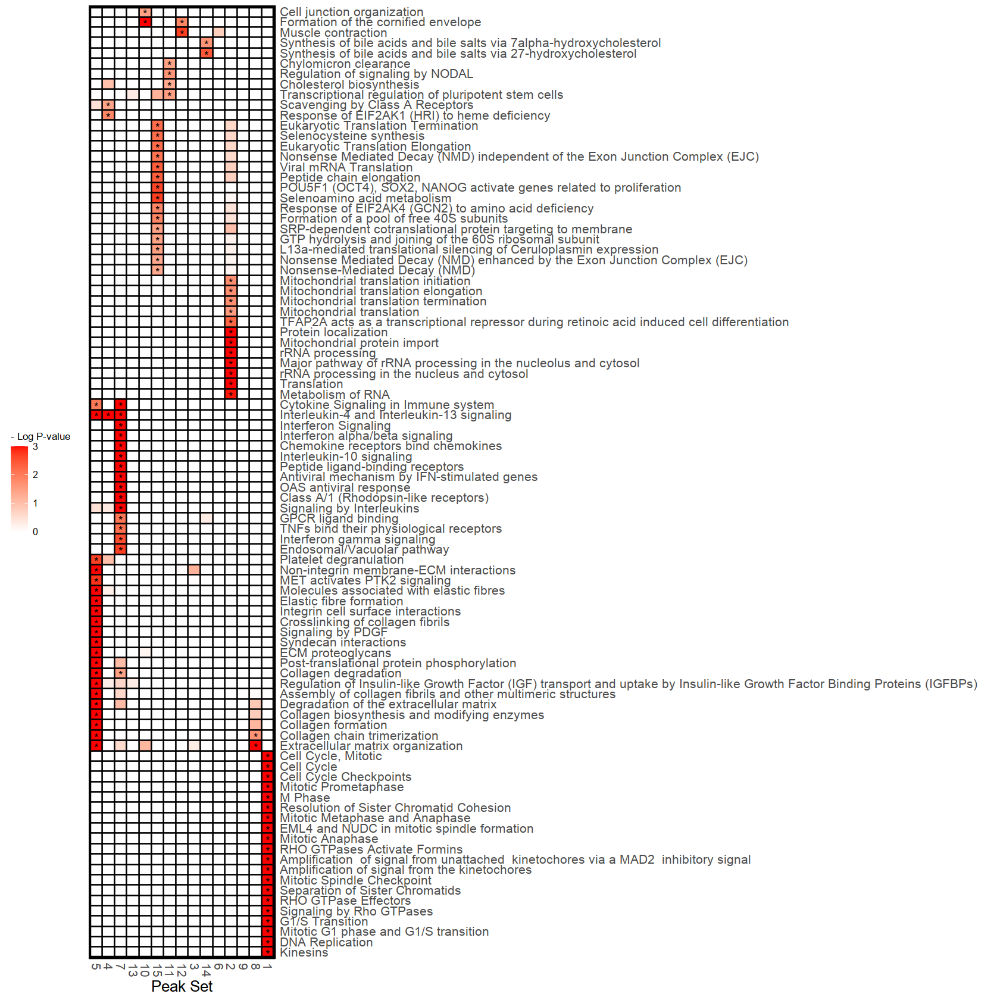

In [202]:
options(repr.plot.width = 14, repr.plot.height = 14)

reac_plot